In [1]:
%pylab inline

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [15]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import random
import igraph as ig
import hypernetx as hnx
from hypernetx import drawing
import hypernetx.algorithms.generative_models as gm
import hypernetx.algorithms.hypergraph_modularity as hmod
import hnxwidget as hnxw
#import graphviz
import math
import warnings
from collections import defaultdict
import pandas as pd
from hypernetx import Hypergraph
from networkx.algorithms.community import k_clique_communities

from netgraph import Graph
import community
from community import community_louvain
from collections import Counter

from itertools import chain
import matplotlib.patches as mpatches
import time

from clusim.clustering import Clustering, print_clustering
import clusim.sim as sim

from transpose_dict import TD

In [3]:
def grapher(n, m, p, x):
    if ((n == 0 or m == 0) and p == 0):
        H = hnx.Hypergraph(x)
    else:
        H = gm.erdos_renyi_hypergraph(n, m, p)
    return H

def drawer(H):
    rubberband = hnx.drawing.rubber_band.draw(H)
    #try:    
    #    bipartit = hnx.drawing.two_column.draw(H)
    #except:
    #    print("No Bipartit for this one")
    #else:
    #    print("Nothing went wrong")
    normal = hmod.two_section(H)
    
    
    return rubberband, normal

start = time.time()

# Write the Julia command here

In [4]:
fallout3 = pd.read_csv('./utils/100Run/100_0.5_linear_he.txt', delimiter="  ", header = None).to_dict()[0]

comms = np.loadtxt('./utils/100Run/100_0.5_linear_comm.txt')
assign = np.loadtxt('./utils/100Run/100_0.5_linear_assign.txt')
deg = np.loadtxt('./utils/100Run/100_0.5_linear_deg.txt')

f03 = {key: list(map(int, value.split())) for key, value in fallout3.items()}

for i in range(0, len(list(f03.keys()))):
    newkeys = (['l' + str(x) for x in range(len(f03))])
    f03[newkeys[i]]=f03.pop(list(f03.keys())[0])


C:\Users\ipobo\AppData\Local\Temp\ipykernel_1388\1254353788.py:1: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  fallout3 = pd.read_csv('./utils/100Run/100_0.5_linear_he.txt', delimiter="  ", header = None).to_dict()[0]


# Plots

Hyperedges for 0.5 linear -- fallout:


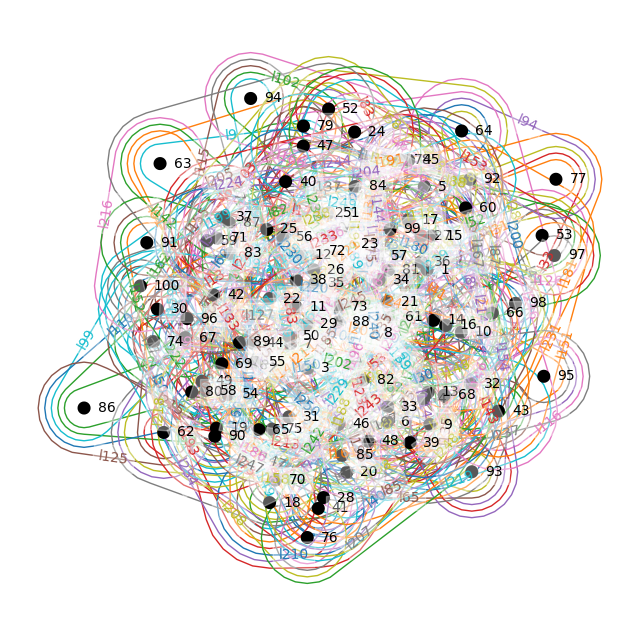

In [5]:
f03p = grapher(0 ,0 ,0 ,f03)
f03p_1, f03p_2 = drawer(f03p)

plt.rcParams['figure.figsize'] = [20, 20]

print("Hyperedges for 0.5 linear -- fallout:")
f03p_1

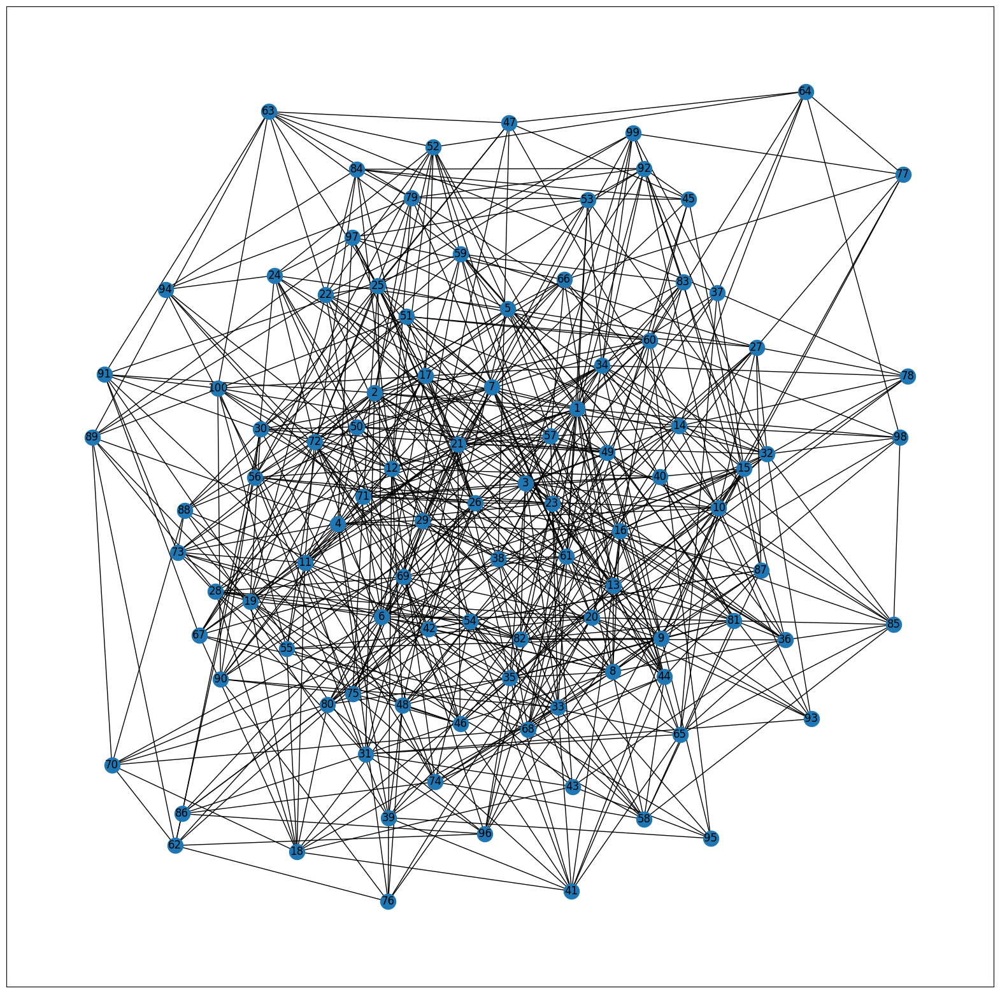

In [6]:
G = nx.Graph()
names = f03p_2.vs['name']
G.add_nodes_from(names)
G.add_edges_from([(names[x[0]], (names[x[1]])) for x in f03p_2.get_edgelist()])

nx.draw_networkx(G, pos=None, arrows=None, with_labels=True)


<class 'networkx.utils.decorators.argmap'> compilation 20:4: FutureWarning: laplacian_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.


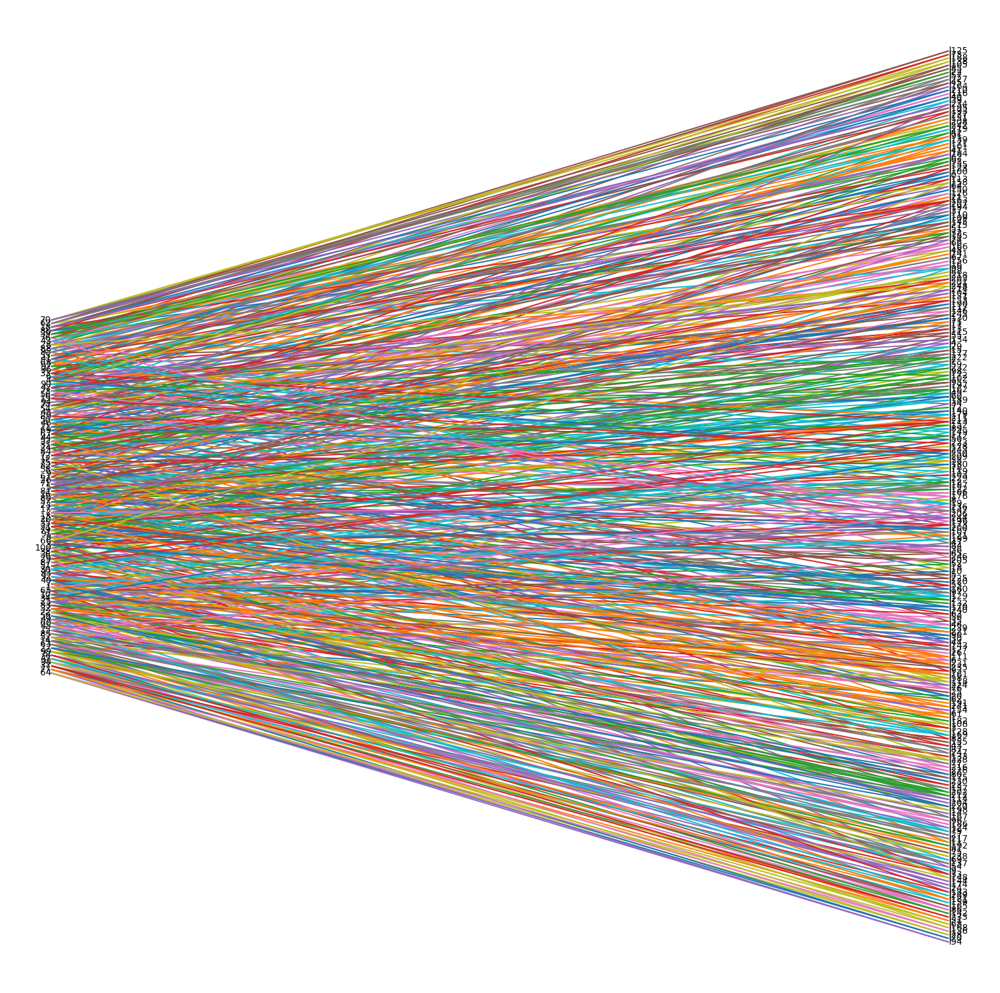

In [7]:
hnx.drawing.two_column.draw(f03p)

### Weighting

In [8]:
sizes = []

for i in range(0, len(f03)):    
    result = [f03[key] for key in f03.keys()]
    sizes.append(len(result[i]))



In [9]:
nxlist = ([(names[x[0]], (names[x[1]])) for x in f03p_2.get_edgelist()])

w = np.array(np.zeros(len(nxlist)))

for i in range(0, len(nxlist)):
    for l in range(0, len(f03)):
        if (nxlist[i][0] in [f03[key] for key in f03.keys()][l]) and (nxlist[i][1] in [f03[key] for key in f03.keys()][l]):
           w[i] += (1/(len([f03[key] for key in f03.keys()][l])-1)) 

w

array([1.        , 0.25      , 0.25      , 1.25      , 0.5       ,
       0.5       , 1.        , 0.25      , 0.5       , 0.5       ,
       1.        , 0.25      , 0.33333333, 1.        , 0.25      ,
       0.33333333, 0.33333333, 0.25      , 1.25      , 0.25      ,
       0.25      , 0.25      , 0.25      , 0.5       , 0.5       ,
       0.5       , 0.5       , 1.        , 1.        , 0.33333333,
       0.5       , 0.33333333, 0.33333333, 0.5       , 0.33333333,
       0.33333333, 0.33333333, 0.5       , 0.5       , 0.33333333,
       0.5       , 1.        , 1.        , 0.33333333, 0.33333333,
       0.33333333, 0.33333333, 0.33333333, 1.        , 0.33333333,
       0.5       , 0.33333333, 0.5       , 1.        , 0.33333333,
       0.25      , 0.25      , 0.5       , 0.25      , 0.5       ,
       0.25      , 1.        , 0.75      , 0.25      , 0.25      ,
       0.25      , 1.        , 0.75      , 1.25      , 0.5       ,
       0.25      , 0.25      , 0.5       , 0.25      , 0.25   

In [10]:
nxlistnew = []
for k in range(0, len(w)):
    nxlistnew.append(nxlist[k] + (w[k], ))
    
nxlistnew

[(41, 44, 1.0),
 (41, 54, 0.25),
 (41, 35, 0.25),
 (41, 18, 1.25),
 (41, 10, 0.5),
 (41, 13, 0.5),
 (41, 39, 1.0),
 (41, 33, 0.25),
 (41, 46, 0.5),
 (41, 75, 0.5),
 (41, 65, 1.0),
 (44, 49, 0.25),
 (44, 87, 0.3333333333333333),
 (44, 23, 1.0),
 (44, 7, 0.25),
 (44, 74, 0.3333333333333333),
 (44, 58, 0.3333333333333333),
 (44, 61, 0.25),
 (44, 50, 1.25),
 (44, 1, 0.25),
 (44, 68, 0.25),
 (44, 38, 0.25),
 (44, 57, 0.25),
 (30, 59, 0.5),
 (30, 91, 0.5),
 (30, 3, 0.5),
 (30, 49, 0.5),
 (30, 47, 1.0),
 (30, 19, 1.0),
 (30, 7, 0.3333333333333333),
 (30, 74, 0.5),
 (30, 50, 0.3333333333333333),
 (30, 29, 0.3333333333333333),
 (30, 86, 0.5),
 (30, 90, 0.3333333333333333),
 (30, 51, 0.3333333333333333),
 (30, 88, 0.3333333333333333),
 (59, 91, 0.5),
 (59, 40, 0.5),
 (59, 12, 0.3333333333333333),
 (59, 27, 0.5),
 (59, 63, 1.0),
 (59, 7, 1.0),
 (59, 20, 0.3333333333333333),
 (59, 69, 0.3333333333333333),
 (59, 1, 0.3333333333333333),
 (59, 52, 0.3333333333333333),
 (59, 83, 0.3333333333333333),
 

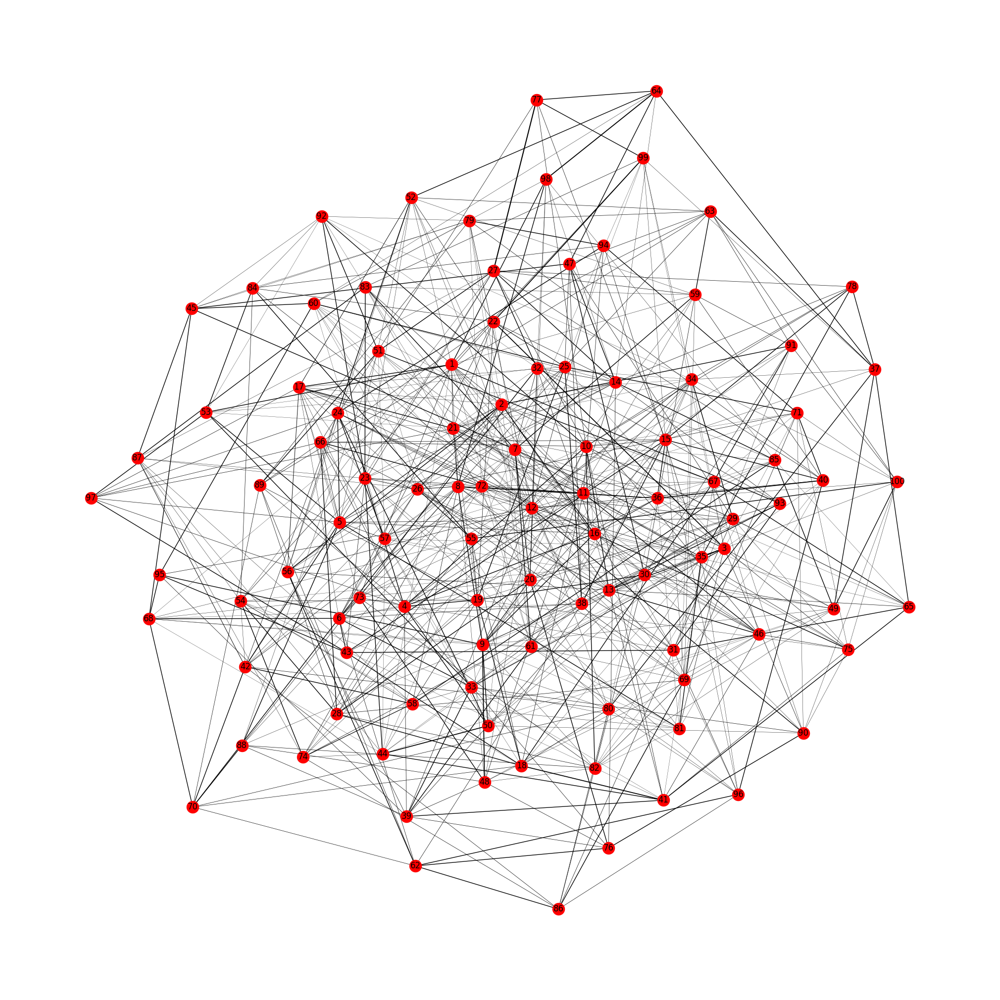

In [11]:
G2 = nx.Graph() 
G2.add_weighted_edges_from(nxlistnew)

edges,weights = zip(*nx.get_edge_attributes(G2,'weight').items())

pos = nx.spring_layout(G2)

#nx.draw(G2, pos, node_color='r',with_labels=True, edgelist=edges, edge_color = weights, width=10.0, edge_cmap=plt.cm.Greens)

nx.draw(G2, pos, node_color='r',with_labels=True, edgelist=edges, width=weights)

#plt.savefig('edges.png')

# Information and histograms

In [12]:
communities3 = list(k_clique_communities(G2, 3, cliques=None))

print('The community sizes as per our generator are:', comms)

for i in range(0, len(communities3)):
    communities3[i] = sorted(list(communities3[i]))
    if len(communities3[i]) == max(comms):
        print('The longest comm is:', communities3[i])

print('With Max community size =', max(comms))

The community sizes as per our generator are: [31. 19. 19. 16. 15.]
With Max community size = 31.0


In [13]:
print('Az átlag fokszám a hipergráfon belül:', np.average(deg))

degrees = [G.degree(n) for n in G.nodes()]
print('Az átlag fokszám a kivetített hálón:', np.average(degrees))

Az átlag fokszám a hipergráfon belül: 6.67
Az átlag fokszám a kivetített hálón: 12.34


KeyboardInterrupt: 

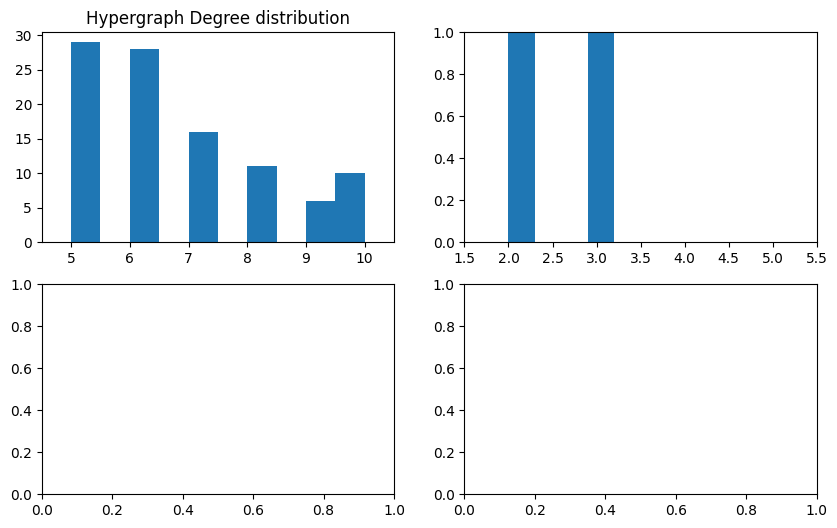

In [14]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 6))

axes[0][0].set_xlim([min(deg)-0.5, max(deg)+0.5])
axes[0][0].hist(deg)
axes[0][0].set_title('Hypergraph Degree distribution')

axes[0][1].set_xlim([min(sizes)-0.5, max(sizes)+0.5])
axes[0][1].hist(sizes, align='mid')
axes[0][1].set_title('Hypergraph Edge size distribution')

axes[1][0].set_xlim([min(w)-0.1, max(w)+0.1])
axes[1][0].hist(w)
axes[1][0].set_title('Graph Weight distribution')

axes[1][1].set_xlim([min(degrees)-0.5, max(degrees)+0.5])
axes[1][1].hist(degrees)
axes[1][1].set_title('Graph Degree distribution')

#csoportméreteloszlás


plt.show()

# Groups and colouring

### ABCD Groups

In [ ]:
number_of_colors = int(max(assign))

color = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
             for i in range(number_of_colors)]
print(color)


['#5268B1', '#D62512', '#0980CD', '#C8C2E6', '#F0AA96']


In [ ]:

communitiesG =  [[] for _ in range(int(max(assign)))]

for j in range(0, int(max(assign))+1):
    for i in range(0, len(assign)):
        if assign[i] == j:
            communitiesG[j-1].append(i+1)



communitiesG

[[3,
  10,
  11,
  12,
  13,
  15,
  28,
  29,
  33,
  34,
  35,
  36,
  38,
  39,
  40,
  41,
  46,
  55,
  61,
  65,
  66,
  69,
  71,
  72,
  73,
  75,
  78,
  81,
  82,
  90,
  100],
 [1, 2, 4, 5, 16, 17, 21, 23, 24, 44, 50, 52, 53, 56, 67, 83, 88, 91, 97],
 [6, 8, 18, 26, 31, 42, 43, 54, 57, 58, 62, 68, 70, 74, 76, 80, 86, 87, 96],
 [7, 19, 22, 25, 30, 45, 47, 51, 59, 63, 79, 84, 89, 92, 94, 99],
 [9, 14, 20, 27, 32, 37, 48, 49, 60, 64, 77, 85, 93, 95, 98]]

In [ ]:
trier = {color[i] : communitiesG[i] for i in range(0, len(communitiesG)) if (color[i] != '#FF0000' or color[i] != '#808080')}

trier

{'#5268B1': [3,
  10,
  11,
  12,
  13,
  15,
  28,
  29,
  33,
  34,
  35,
  36,
  38,
  39,
  40,
  41,
  46,
  55,
  61,
  65,
  66,
  69,
  71,
  72,
  73,
  75,
  78,
  81,
  82,
  90,
  100],
 '#D62512': [1,
  2,
  4,
  5,
  16,
  17,
  21,
  23,
  24,
  44,
  50,
  52,
  53,
  56,
  67,
  83,
  88,
  91,
  97],
 '#0980CD': [6,
  8,
  18,
  26,
  31,
  42,
  43,
  54,
  57,
  58,
  62,
  68,
  70,
  74,
  76,
  80,
  86,
  87,
  96],
 '#C8C2E6': [7, 19, 22, 25, 30, 45, 47, 51, 59, 63, 79, 84, 89, 92, 94, 99],
 '#F0AA96': [9, 14, 20, 27, 32, 37, 48, 49, 60, 64, 77, 85, 93, 95, 98]}

In [ ]:
nodelist = []
for nodes in G2.nodes():
    nodelist.append(nodes)

color_map=[]
size=[]

for node in nodelist:
    if node in list(chain(*trier.values())):
        if (list(chain(*trier.values())).count(node) == 1):
            #color_map.append('green')
            for i in range(0, len(list(trier.values()))):
                if (node in list(trier.values())[i]) == True:
                    c = color[i] 
                    color_map.append(c)
        else:
            color_map.append('#FF0000')
    else:
        color_map.append('#808080')
        
#color_map

for i in range (0, len(color_map)):
    if color_map[i] == '#FF0000':
        size.append(600)
    elif color_map[i] == '#808080':
        size.append(250)
    else:
        size.append(450)
        
#size

In [ ]:
legend = []
lista = []

for i in range(0, len(communitiesG)):
    #legend.append(Line2D([0], [0], marker='o', color=color[i], label='Group {}'.format(i)
                           #,markerfacecolor=color[i], markersize=15))
    #legend.append(mpatches.Patch(color=color[i], label='Group {}'.format(i + 1)))
    legend.append(mpatches.Patch(color=color[i], label=(communitiesG[i])))
    lista = legend #+ [mpatches.Patch(color= '#FF0000', label='Multigroups'), mpatches.Patch(color= '#808080', label='0 groups')]

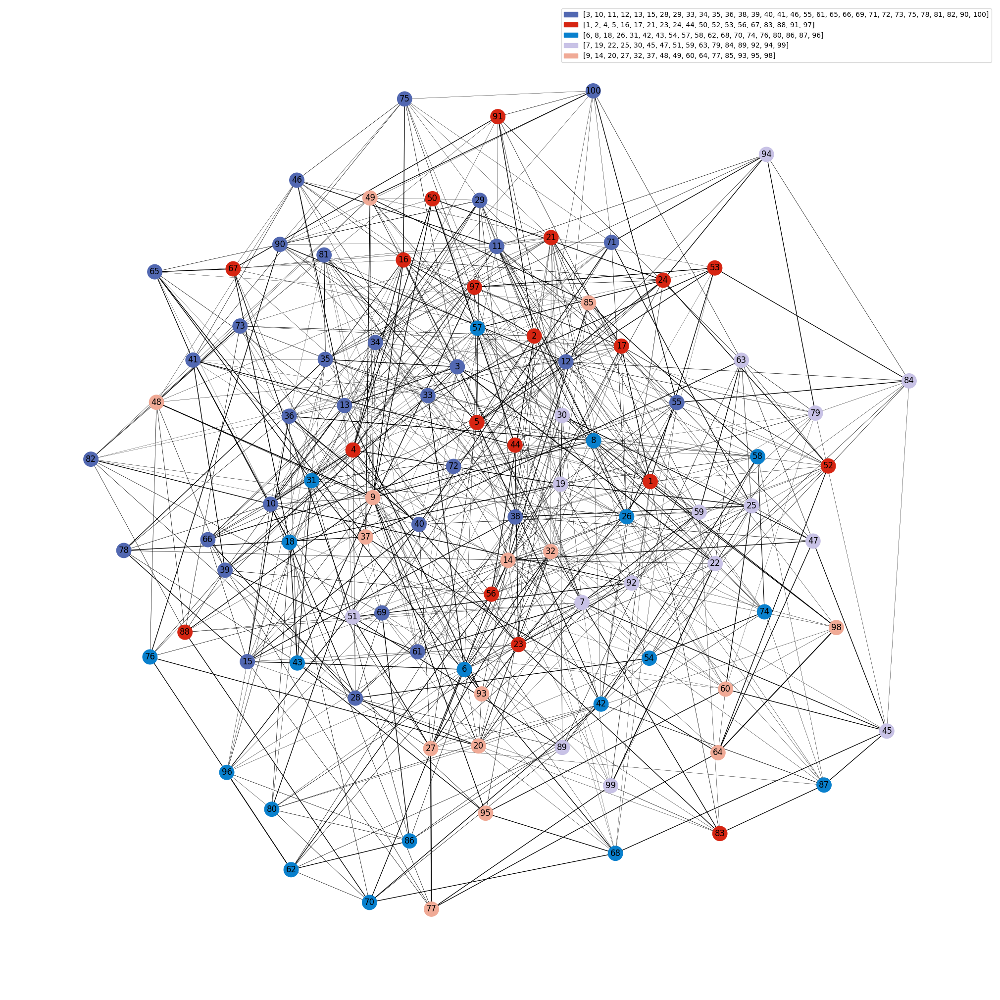

In [ ]:
nx.draw(G2, pos = nx.spring_layout(G2)  , node_color=color_map ,with_labels=True, node_size = size, edgelist=edges, width=weights)
plt.legend('csop:színek', loc='upper left')

plt.legend(handles = [lista[i] for i in range(0, len(lista))])

plt.show()

### K_clique groups

In [ ]:
def clique_coloring(graph, k):
    communities = []
    color_map=[]
    size=[]
    legend = []
    lista = []

    for i in range(0, len(list(k_clique_communities(graph, k, cliques=None)))):
        communities.append(sorted(list(k_clique_communities(graph, k))[i]))    
        
    number_of_colors = len(communities)

    color = ["#"+''.join([random.choice('0123456789ABCDEF') for k in range(6)])
                for l in range(number_of_colors)]
    
    trier = {color[i] : communities[i] for i in range(0, len(communities)) if (color[i] != '#FF0000' or color[i] != '#808080')}

    for node in nodelist:
        if node in list(chain(*trier.values())):
            if (list(chain(*trier.values())).count(node) == 1):
                #color_map.append('green')
                for i in range(0, len(list(trier.values()))):
                    if (node in list(trier.values())[i]) == True:
                        c = color[i] 
                        color_map.append(c)
            else:
                color_map.append('#FF0000')
        else:
            color_map.append('#808080')


    for i in range (0, len(color_map)):
        if color_map[i] == '#FF0000':
            size.append(600)
        elif color_map[i] == '#808080':
            size.append(250)
        else:
            size.append(450)
        
    for i in range(0, len(communities)):
        legend.append(mpatches.Patch(color=color[i], label=(communities[i])))
        lista = legend + [mpatches.Patch(color= '#FF0000', label='Multigroups'), mpatches.Patch(color= '#808080', label='0 groups')]
    
    if communities == []:
        print('No groups for k =', k)
    else:
        nx.draw(graph, pos = nx.kamada_kawai_layout(graph)  , node_color=color_map ,with_labels=True, node_size = size, edgelist=edges, width=weights)
        plt.legend('csop:színek', loc='upper left')

        plt.legend(handles = [lista[i] for i in range(0, len(lista))])

        plt.show()
    
    return(communities)

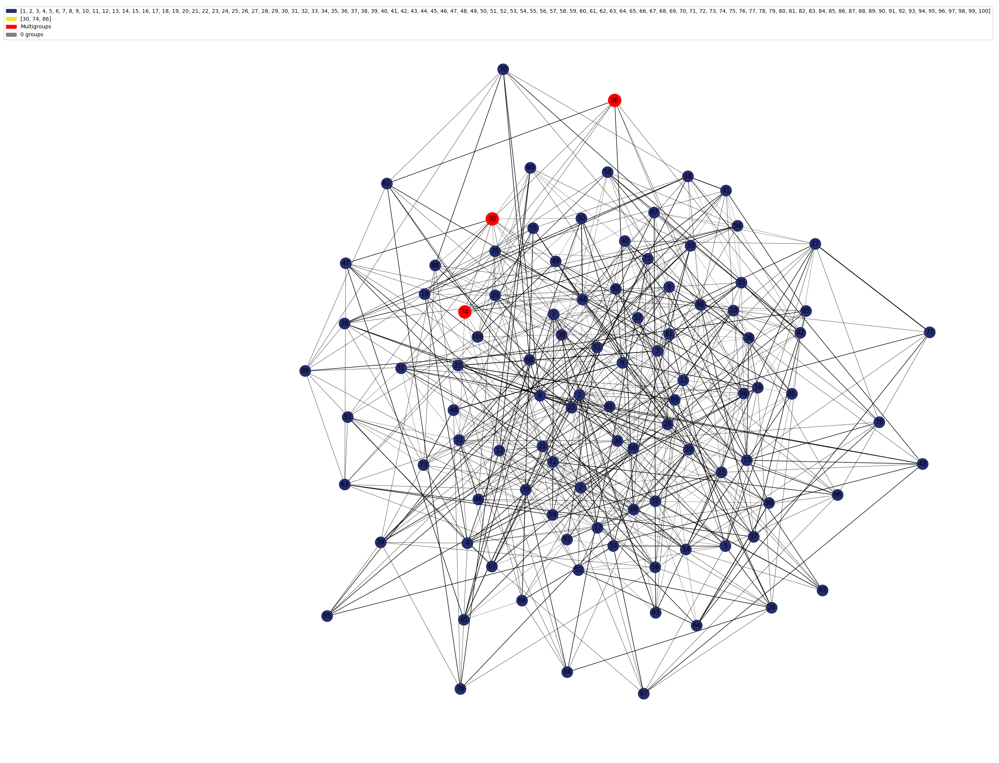

[[1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75,
  76,
  77,
  78,
  79,
  80,
  81,
  82,
  83,
  84,
  85,
  86,
  87,
  88,
  89,
  90,
  91,
  92,
  93,
  94,
  95,
  96,
  97,
  98,
  99,
  100],
 [30, 74, 86]]

In [ ]:
comm3 = clique_coloring(G2, 3)
comm3

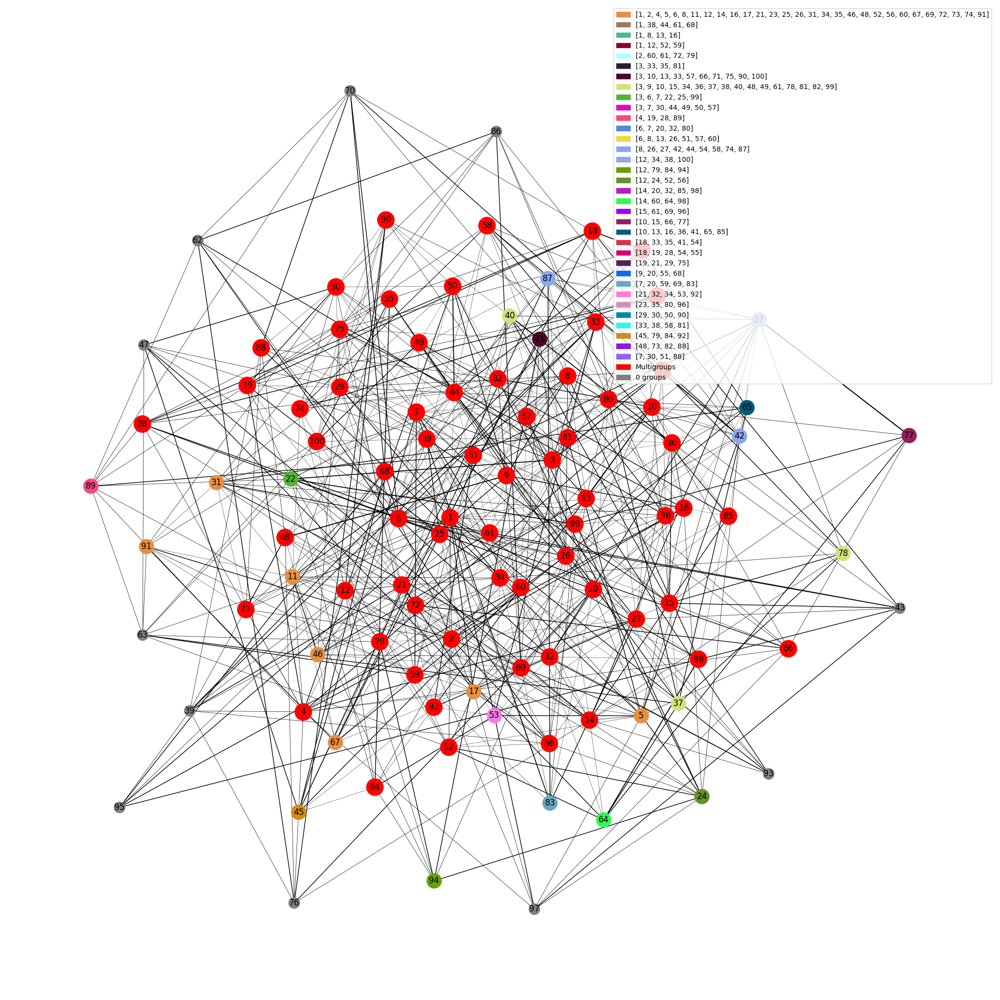

In [ ]:
comm4 = clique_coloring(G2, 4)

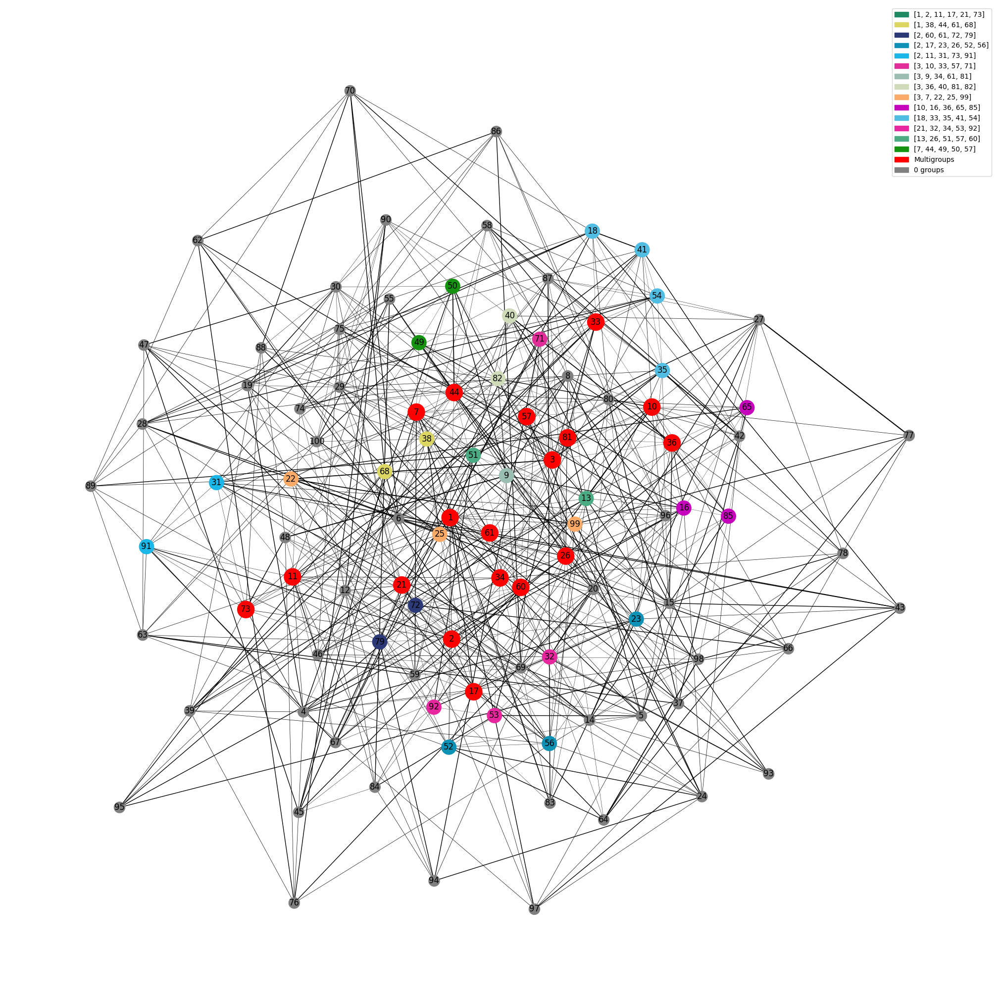

[[1, 2, 11, 17, 21, 73],
 [1, 38, 44, 61, 68],
 [2, 60, 61, 72, 79],
 [2, 17, 23, 26, 52, 56],
 [2, 11, 31, 73, 91],
 [3, 10, 33, 57, 71],
 [3, 9, 34, 61, 81],
 [3, 36, 40, 81, 82],
 [3, 7, 22, 25, 99],
 [10, 16, 36, 65, 85],
 [18, 33, 35, 41, 54],
 [21, 32, 34, 53, 92],
 [13, 26, 51, 57, 60],
 [7, 44, 49, 50, 57]]

In [ ]:
comm5 = clique_coloring(G2, 5)
comm5

# Susceptibility and Weight levels

In [ ]:
weightlist = [0.0, ] + sorted(list(set(w)))
weighted_dict = {}
graphs = {}
communities = {}
community_sizes = {}
susceptibility = []

for l in range(0, len(weightlist)):
    weighted_dict['weightup_%s' % weightlist[l]] = []
    graphs['graph_%s' % l] =  nx.Graph() 
    communities['c_%s' % l] = []
    community_sizes['c_%s' % l] = []
    
    weighted_dict['weightup_%s' % weightlist[l]] = [(u, v, d) for (u, v, d) in nxlistnew if d > weightlist[l]]
    graphs['graph_%s' % l].add_weighted_edges_from(weighted_dict['weightup_%s' % weightlist[l]])

    for i in range(0, len(list(k_clique_communities(graphs['graph_%s' % l], 2, cliques=None)))):
        communities['c_%s' % l].append(sorted(list(k_clique_communities(graphs['graph_%s' % l], 2))[i]))
        
    for k in range(0, len(communities['c_%s' % l])):  
        community_sizes['c_%s' % l].append(len(communities['c_%s' % l][k]))       
        
    if (sum(community_sizes['c_%s' % l][1:])) ==0.0:
        susceptibility.append(0.0)
    else:        
        susceptibility.append((sum(community_sizes['c_%s' % l][1:]))/(len(community_sizes['c_%s' % l])-1))
    #community_sizes['c_%s' % l] = (len(communities['c_%s' % l][i]) for i in range(0, len(communities['c_%s' % l])))

    if len(communities['c_%s' % l]) == 0:
        communities['c_%s' % l] = [[]]
        

In [ ]:
community_sizes

{'c_0': [100],
 'c_1': [100],
 'c_2': [100],
 'c_3': [98, 2],
 'c_4': [98, 2],
 'c_5': [98, 2],
 'c_6': [98, 2],
 'c_7': [98, 2],
 'c_8': [2, 2, 2, 2, 2, 2, 3],
 'c_9': [2, 2, 2],
 'c_10': [2],
 'c_11': []}

In [ ]:
susceptibility

[0.0, 0.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.1666666666666665, 2.0, 0.0, 0.0]

In [ ]:
comm_sizes = []
comm_maxes = []

for l in range(0, len(weightlist)-1):   
    comm_sizes.append(len(communities['c_%s' % l]))
    comm_maxes.append(max(len(communities['c_%s' % l][i]) for i in range(0, len(communities['c_%s' % l]))))
    
comm_maxes = comm_maxes + [0]
no_of_comms = comm_sizes + [0]

In [ ]:
comm_maxes

[100, 100, 100, 98, 98, 98, 98, 98, 3, 2, 2, 0]

In [ ]:
no_of_comms

[1, 1, 1, 2, 2, 2, 2, 2, 7, 3, 1, 0]

In [ ]:
weightlist

[0.0,
 0.25,
 0.3333333333333333,
 0.5,
 0.5833333333333333,
 0.6666666666666666,
 0.75,
 0.8333333333333333,
 1.0,
 1.25,
 1.3333333333333333,
 1.5]

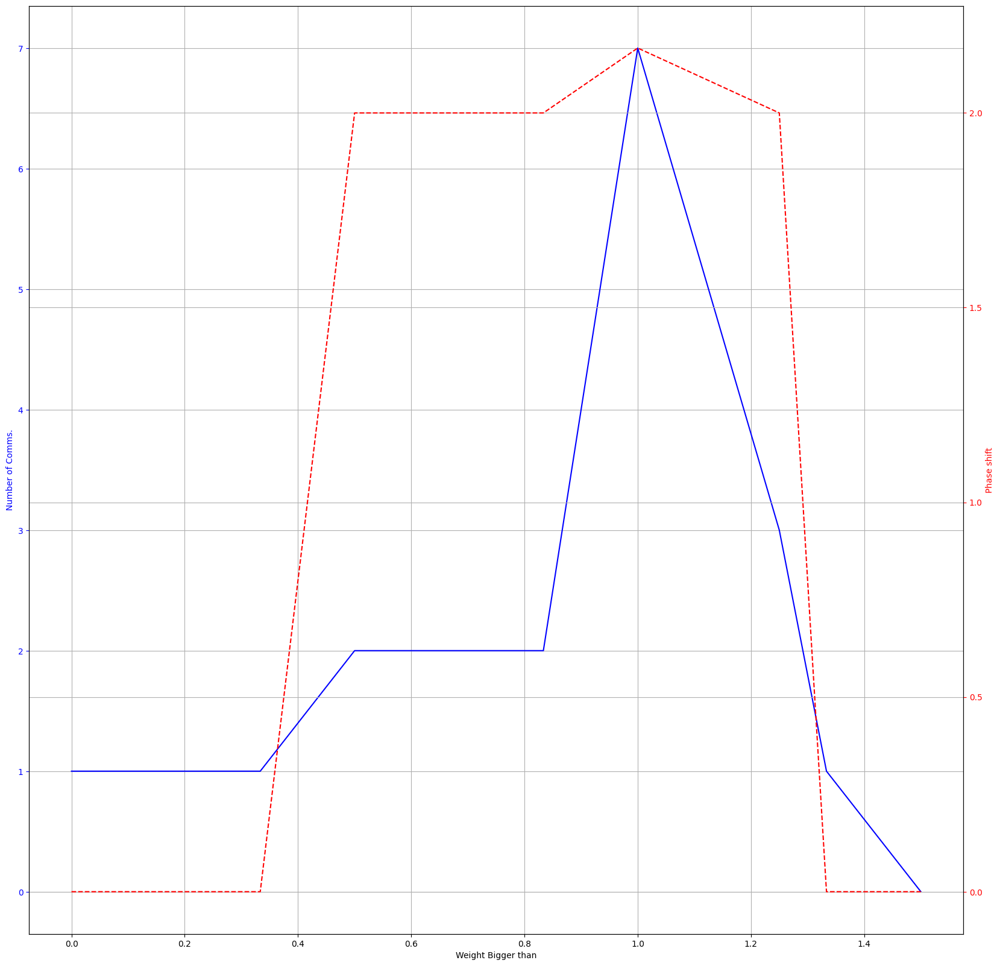

In [ ]:
fig, ax = plt.subplots()

ax.plot(weightlist, no_of_comms, color="blue")                  # set line color to blue
ax.set_xlabel('Weight Bigger than')
ax.set_ylabel('Number of Comms.', color="blue")        # set y axis title to blue
ax.tick_params(axis='y', colors="blue")  
ax.grid(True)# set y axis tick labels to blue

# We create another axis object. It shares the same x axis as ax, but the y-axis is separate.
ax2 = ax.twinx()
ax2.plot(weightlist, susceptibility, color="red", linestyle = 'dashed')                  # set line color to red
ax2.set_ylabel('Phase shift', color="red")        # set y axis title to red
ax2.tick_params(axis='y', colors="red")       # set y axis tick labels to red
ax2.grid(True)

plt.show()

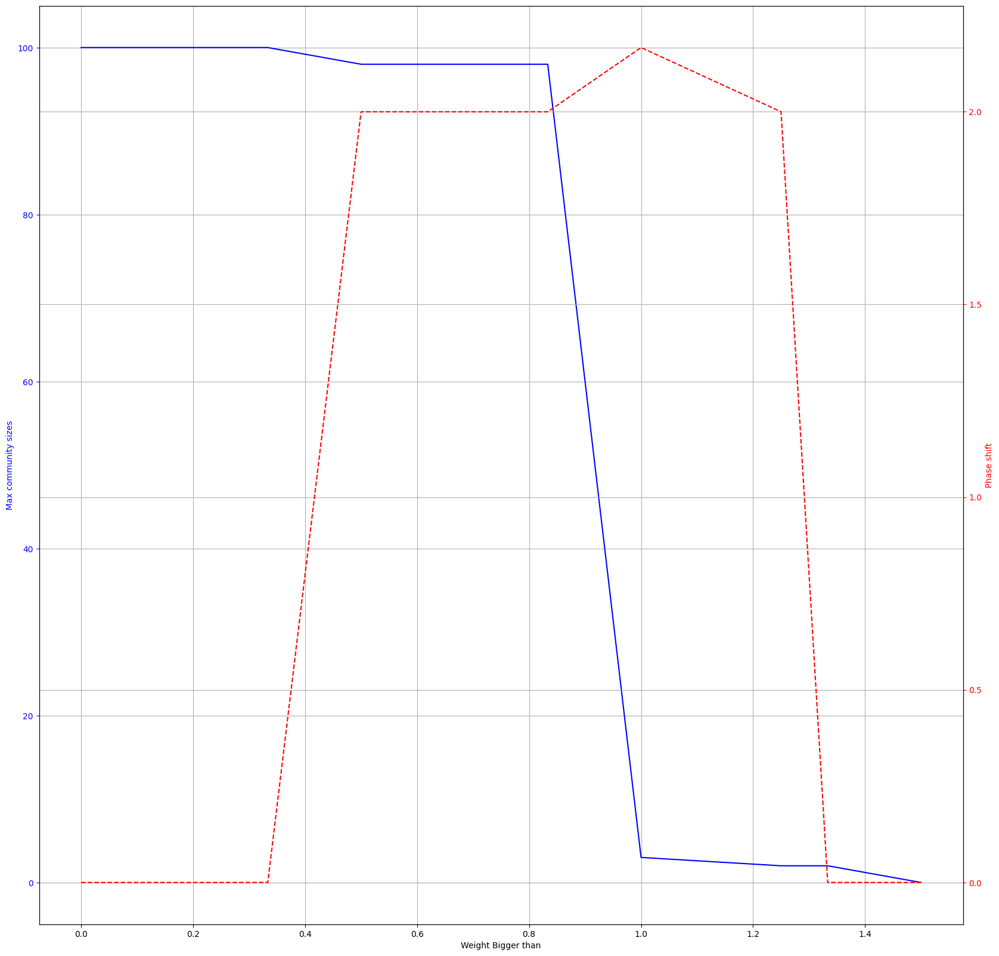

In [ ]:
fig, ax = plt.subplots()

ax.plot(weightlist, comm_maxes, color="blue")                  # set line color to blue
ax.set_xlabel('Weight Bigger than')
ax.set_ylabel('Max community sizes', color="blue")        # set y axis title to blue
ax.tick_params(axis='y', colors="blue")  
ax.grid(True)# set y axis tick labels to blue

# We create another axis object. It shares the same x axis as ax, but the y-axis is separate.
ax2 = ax.twinx()
ax2.plot(weightlist, susceptibility, color="red", linestyle = 'dashed')                  # set line color to red
ax2.set_ylabel('Phase shift', color="red")        # set y axis title to red
ax2.tick_params(axis='y', colors="red")       # set y axis tick labels to red
ax2.grid(True)

plt.show()

# Clustering number

In [ ]:
ABCD_groups = {}
clique_groups = {}
groups_k = {}

N = 2

for i in range(1, len(assign)+1):
    ABCD_groups[i] = [int(assign[i-1])]
    
#------------------------------------------------------------------------

for i in range(0, len(weightlist)):
    groups_k['w_%s' % weightlist[i]] = {}
    for l in range(1, len(list(k_clique_communities(graphs['graph_%s' % i], N, cliques=None))) + 1):
        groups_k['w_%s' % weightlist[i]][l] = []
        #groups_k['w_%s' % weightlist[i]][0] = []
        groups_k['w_%s' % weightlist[i]][l] = (sorted(list(k_clique_communities(graphs['graph_%s' % i], N))[l-1]))
    clique_groups['w_%s' % weightlist[i]] = {}
    for k in groups_k['w_%s' % weightlist[i]]:
        for v in groups_k['w_%s' % weightlist[i]][k]:
             clique_groups['w_%s' % weightlist[i]].setdefault(v, []).append(k)
    #middleman['w_%s' % weightlist[i]] = dict((v, [k]) for k in groups_k['w_%s' % weightlist[i]] for v in groups_k['w_%s' % weightlist[i]][k])
    for j in [x for x in range(1,max(nodelist)+1) if x not in (list(dict((v, [k]) for k in groups_k['w_%s' % weightlist[i]] for v in groups_k['w_%s' % weightlist[i]][k]).keys()))]:
        clique_groups['w_%s' % weightlist[i]][j] = [0]


#ABCD_groups

In [ ]:
clustering_ABCD = Clustering(ABCD_groups)

clustering_clique = {}

similarities = []

for i in range(1, len(clique_groups) + 1):
    clustering_clique[i] = Clustering(clique_groups['w_%s' % weightlist[i-1]])
    similarities.append( sim.element_sim(clustering_ABCD, clustering_clique[i], alpha = 0.9))
    print("Element-centric Similarity No.%s:" %i, sim.element_sim(clustering_ABCD, clustering_clique[i], alpha = 0.9) )
    

#clustering2 = Clustering(clique_groups['w_0.0'])

Element-centric Similarity No.1: 0.21639999999999993
Element-centric Similarity No.2: 0.21639999999999993
Element-centric Similarity No.3: 0.21639999999999993
Element-centric Similarity No.4: 0.20986175115207362
Element-centric Similarity No.5: 0.20986175115207362
Element-centric Similarity No.6: 0.20986175115207362
Element-centric Similarity No.7: 0.20986175115207362
Element-centric Similarity No.8: 0.20986175115207362
Element-centric Similarity No.9: 0.20553765105363028
Element-centric Similarity No.10: 0.2228936170212765
Element-centric Similarity No.11: 0.2177687074829931
Element-centric Similarity No.12: 0.21639999999999993


'fig, ax = plt.subplots()\n\nax.plot(weightlist, similarities, color="blue")                  # set line color to blue\nax.set_xlabel(\'Weight Bigger than\')\nax.set_ylabel(\'Max community sizes\', color="blue")        # set y axis title to blue\nax.tick_params(axis=\'y\', colors="blue")  \nax.grid(True)# set y axis tick labels to blue\n\n# We create another axis object. It shares the same x axis as ax, but the y-axis is separate.\nax2 = ax.twinx()\nax2.plot(weightlist, susceptibility, color="red", linestyle = \'dashed\')                  # set line color to red\nax2.set_ylabel(\'Phase shift\', color="red")        # set y axis title to red\nax2.tick_params(axis=\'y\', colors="red")       # set y axis tick labels to red\nax2.grid(True)\n\nplt.show()'

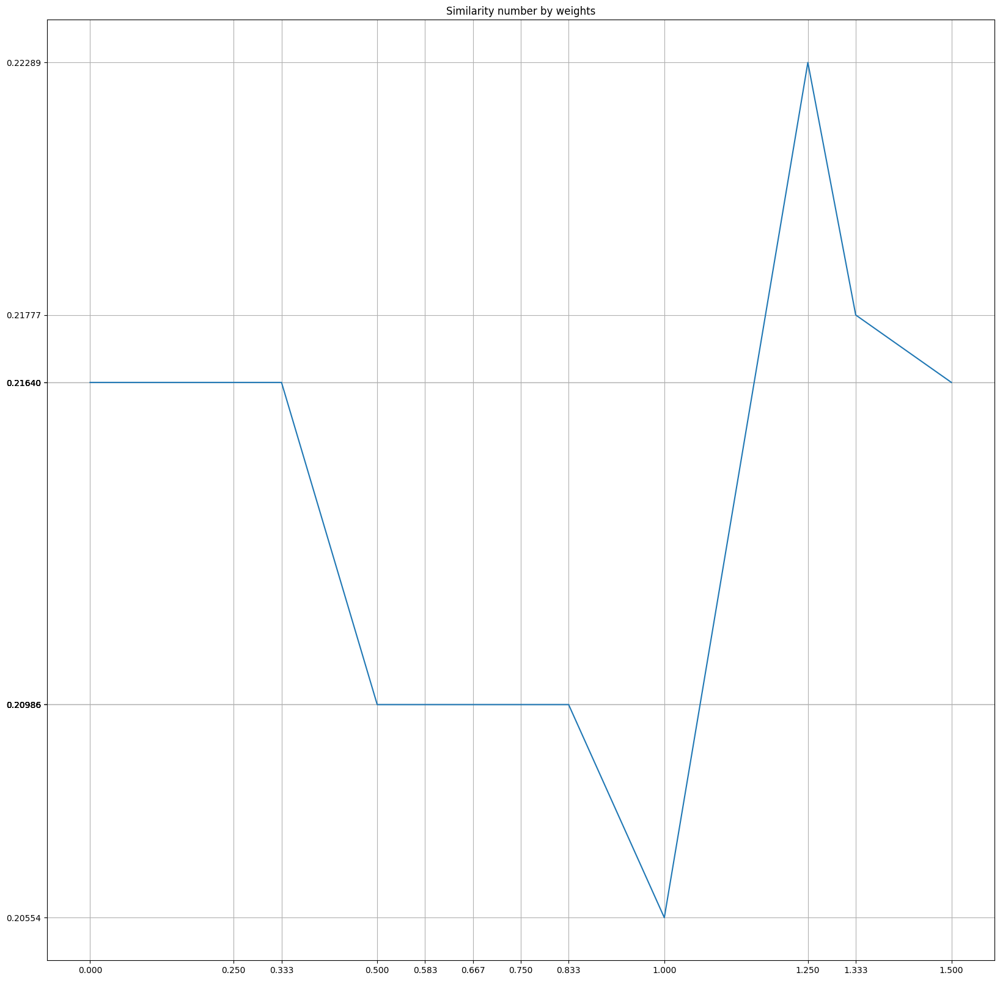

In [ ]:
plt.plot(weightlist, similarities)
plt.xticks(weightlist)
plt.yticks(similarities)
plt.title('Similarity number by weights')
plt.grid(True)



"""fig, ax = plt.subplots()

ax.plot(weightlist, similarities, color="blue")                  # set line color to blue
ax.set_xlabel('Weight Bigger than')
ax.set_ylabel('Max community sizes', color="blue")        # set y axis title to blue
ax.tick_params(axis='y', colors="blue")  
ax.grid(True)# set y axis tick labels to blue

# We create another axis object. It shares the same x axis as ax, but the y-axis is separate.
ax2 = ax.twinx()
ax2.plot(weightlist, susceptibility, color="red", linestyle = 'dashed')                  # set line color to red
ax2.set_ylabel('Phase shift', color="red")        # set y axis title to red
ax2.tick_params(axis='y', colors="red")       # set y axis tick labels to red
ax2.grid(True)

plt.show()"""